**DA24C026** - Assignment 9

In [2]:
import numpy as np 
import pandas as pd
import random
import os
from PIL import Image
from sklearn.decomposition import PCA
from sklearn.manifold import Isomap, TSNE
import matplotlib.pyplot as plt
from matplotlib import offsetbox

In [3]:
data = pd.read_csv('/kaggle/input/visual-taxonomy/train.csv')

In [4]:
data.head()

,id,Category,len,attr_1,attr_2,attr_3,attr_4,attr_5,attr_6,attr_7,attr_8,attr_9,attr_10
0,0,Men Tshirts,5,default,round,printed,default,short sleeves,NaN,NaN,NaN,NaN,NaN
1,1,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
2,2,Men Tshirts,5,default,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
3,3,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
4,4,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN


In [143]:
data.describe(include = 'all')

,id,Category,len,attr_1,attr_2,attr_3,attr_4,attr_5,attr_6,attr_7,attr_8,attr_9,attr_10
count,70213.000000,70213,70213.000000,51867,55192,54698,59888,56493,38116,41415,37474,33565,24999
unique,NaN,5,NaN,18,14,10,19,14,7,11,10,13,8
top,NaN,Women Tops & Tunics,NaN,default,regular,regular,printed,casual,short sleeves,regular sleeves,zari woven,regular sleeves,no
freq,NaN,19004,NaN,9268,17222,15546,14285,12358,13703,14661,13533,7480,14835
mean,35254.985872,NaN,8.850569,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,20295.174166,NaN,1.559819,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.000000,NaN,5.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,17718.000000,NaN,8.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,35272.000000,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,52825.000000,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**Task 1**

In [144]:
categories = ["Men Tshirts", "Sarees", "Kurtis", "Women Tshirts", "Women Tops & Tunics"]
samples = {}
random.seed(41)
for category in categories:
    attributes = ["attr_1", "attr_2", "attr_3", "attr_4", "attr_5", "attr_6", "attr_7", "attr_8", "attr_9", "attr_10"]
    i = 0
    while i<2:
        attr = random.choice(attributes) 
        basket = data[(data['Category'] == category) & (data[attr].notna())]
        if len(basket) >= 100:
            samples[f'{category}_{attr}'] = basket['id'].sample(100).tolist()
            i = i+1
            attributes.remove(attr)

In [145]:
print(samples.items())

dict_items([('Men Tshirts_attr_4', [301, 1649, 626, 860, 2075, 2562, 2156, 4265, 5461, 5777, 3807, 2437, 6559, 700, 739, 4066, 2556, 4375, 4931, 3896, 4906, 3322, 5421, 5714, 4740, 3913, 1131, 2983, 2580, 3225, 1471, 2550, 1497, 624, 805, 3854, 3969, 6721, 1888, 990, 6463, 3274, 4377, 243, 1655, 6893, 3825, 2114, 2289, 2092, 778, 6369, 4928, 239, 2509, 1173, 668, 96, 5154, 4666, 6179, 5170, 4490, 1125, 533, 3714, 919, 956, 2112, 1287, 238, 1084, 555, 4604, 2104, 3945, 158, 6034, 5978, 5542, 2364, 5116, 2048, 3261, 5965, 2280, 1221, 6906, 857, 1339, 4318, 4825, 460, 5122, 2994, 4785, 2678, 4978, 8, 4575]), ('Men Tshirts_attr_3', [4937, 481, 5599, 4504, 2499, 1849, 4770, 5524, 1678, 932, 5690, 2392, 2166, 6264, 2856, 1318, 3886, 7344, 3359, 2493, 6097, 2743, 635, 2127, 1594, 4781, 5479, 4102, 516, 4422, 7231, 34, 626, 1634, 6029, 3185, 6438, 6794, 3984, 1942, 542, 180, 2866, 1644, 4296, 2334, 1923, 4555, 2750, 4077, 6171, 3201, 866, 1164, 4431, 4388, 2855, 2749, 1577, 5023, 4346, 4008, 3

Created 10 baskets for all 5 different categories with random attributes.

**Task 2 and Task 3** 

Plotting TSNE and Isomaps for each category - attribute pairs and identifying and interpreting pairs.

In [146]:
# Helper function
def load_and_preprocess_images(ids):
    images = []
    actual_images=[]
    for product_id in ids:
        formatted_id = str(product_id).zfill(6)
        img_path = f"/kaggle/input/visual-taxonomy/train_images/{formatted_id}.jpg"
        img = Image.open(img_path) 
        img = img.resize((64, 64))
        images.append(np.array(img).flatten())
        actual_images.append(img)
    return np.array(images), actual_images

In [147]:
# Helper function
def plot_components(data, model, images=None, ax=None,
                    thumb_frac=0.05, cmap='gray'):
    ax = ax or plt.gca()

    proj = model.fit_transform(data)
    ax.plot(proj[:, 0], proj[:, 1], '.k')

    if images is not None:
        min_dist_2 = (thumb_frac * max(proj.max(0) - proj.min(0))) ** 2
        shown_images = np.array([2 * proj.max(0)])
        for i in range(data.shape[0]):
            dist = np.sum((proj[i] - shown_images) ** 2, 1)
            if np.min(dist) < min_dist_2:
                # don't show points that are too close
                continue
            shown_images = np.vstack([shown_images, proj[i]])
            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(images[i], cmap=cmap),
                                      proj[i])
            ax.add_artist(imagebox)

In [148]:
# Projection Models initialization
isomap = Isomap(n_neighbors=5, n_components=2)
tsne = TSNE(n_components=2, random_state=42)

a.) **Men Tshirts**

In [149]:
images, actual_images = load_and_preprocess_images(samples['Men Tshirts_attr_4'])

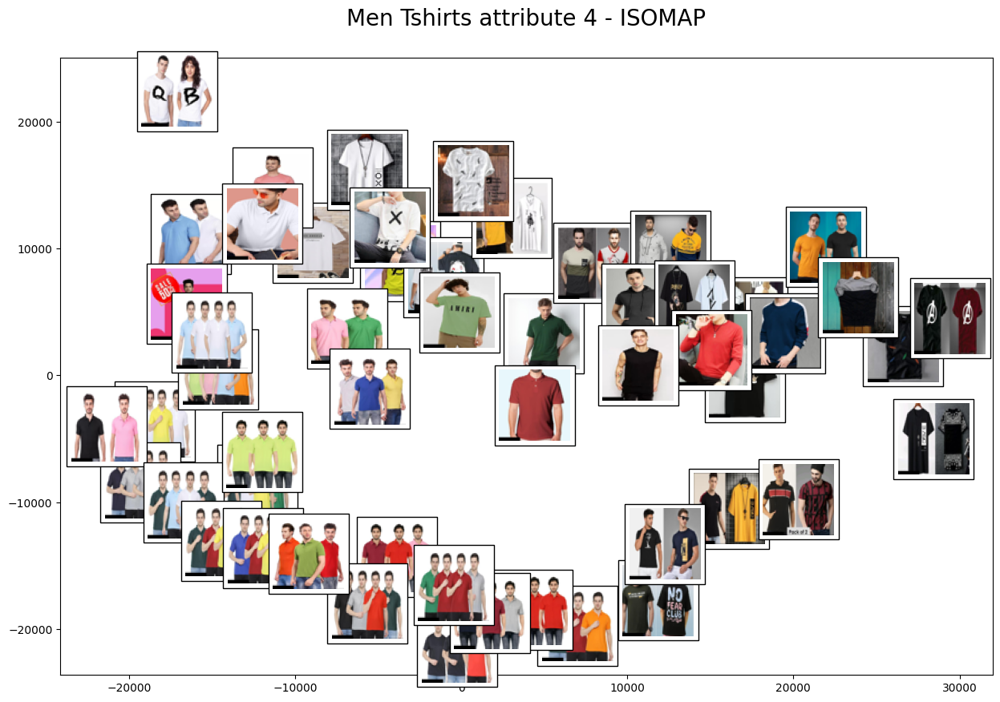

In [150]:
plot_components(images,isomap, actual_images)
plt.title("Men Tshirts attribute 4 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

**Results - Interpretation**

1. X-axis: Component name - Color Intensity & Formality

T-shirts on the left side of the plot appear to have more solid colors, often in neutral or pastel shades, typically associated with a classic or formal look. Moving towards the right, we see more vibrant colors and graphic designs, which are usually associated with casual or trendy attire.

2. Y-axis: Component name - Design Complexity

The bottom half of the plot mostly includes simple T-shirts, which may lack intricate designs or have minimal text, suggesting a more minimalist aesthetic. The upper half, however, features shirts with graphic prints, brand logos, or layered designs.

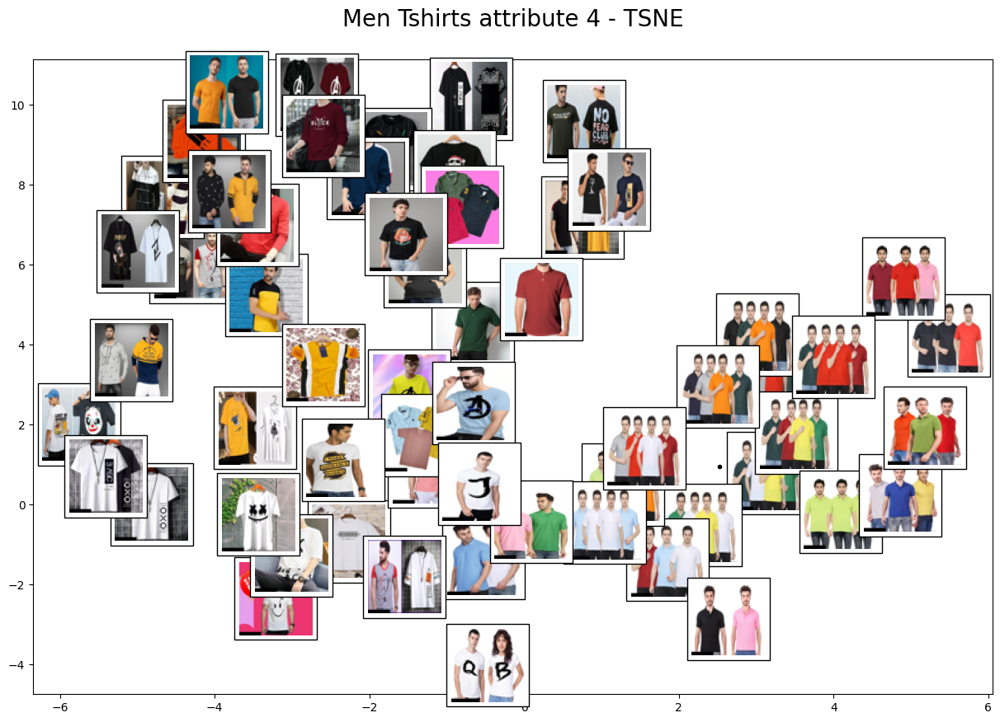

In [151]:
plot_components(images,tsne, actual_images)
plt.title("Men Tshirts attribute 4 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

**Results - Interpretation**

Similar to ISOMAP, in TSNE projection also two key dimensions emerge:

1.) Formality Spectrum (X-axis): Ranges from basic, solid-colored T-shirts (formal/classic) to vibrant, graphic-heavy designs (casual/trendy).

2.) Design Complexity (Y-axis): Moves from minimalist shirts to those with intricate graphics, logos, or branding.

In [152]:
images, actual_images = load_and_preprocess_images(samples['Men Tshirts_attr_3'])

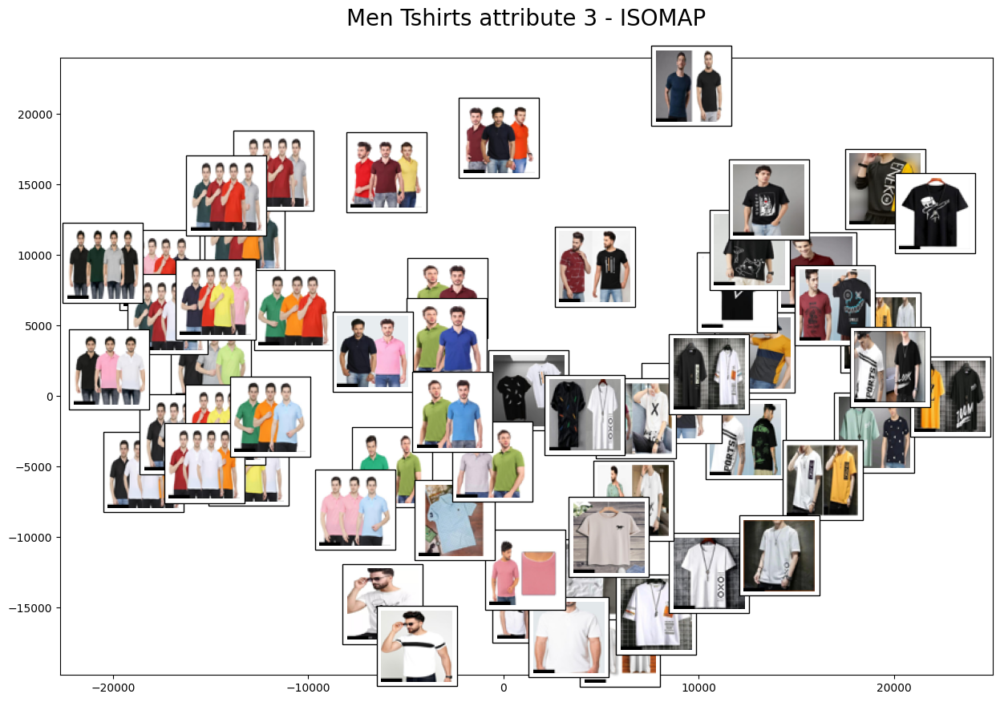

In [154]:
plot_components(images,isomap, actual_images)
plt.title("Men Tshirts attribute 3 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

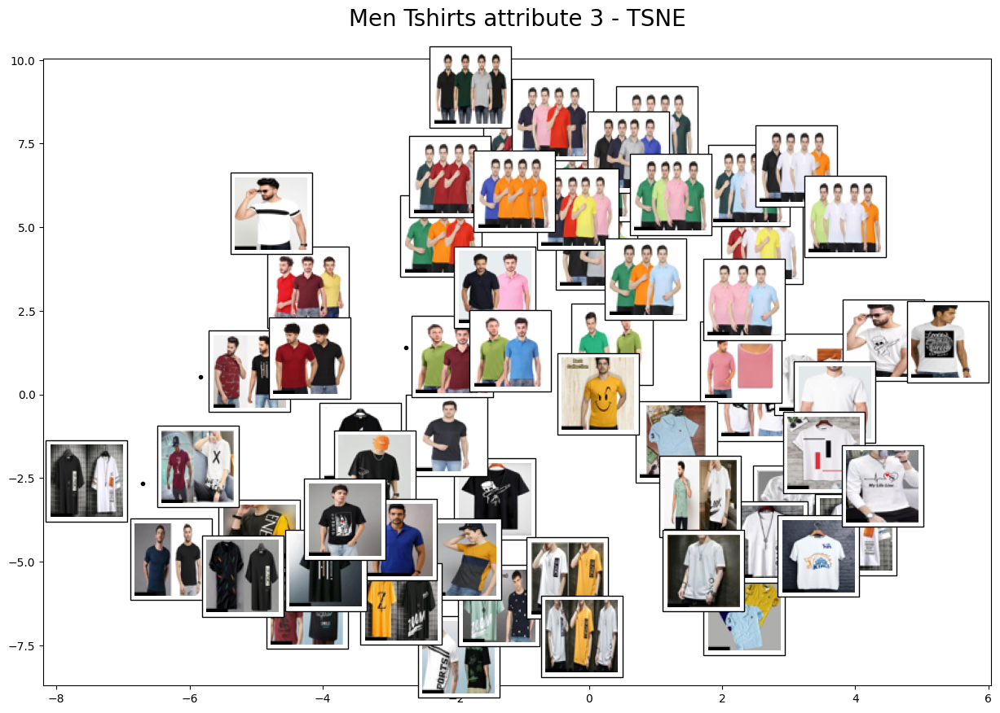

In [155]:
plot_components(images,tsne, actual_images)
plt.title("Men Tshirts attribute 3 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

X - axis -> color shade (dark to light)

y - axis -> Design complexity (complex to simple)

b.) **SAREES**

In [157]:
images, actual_images = load_and_preprocess_images(samples['Sarees_attr_7'])

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:373: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])


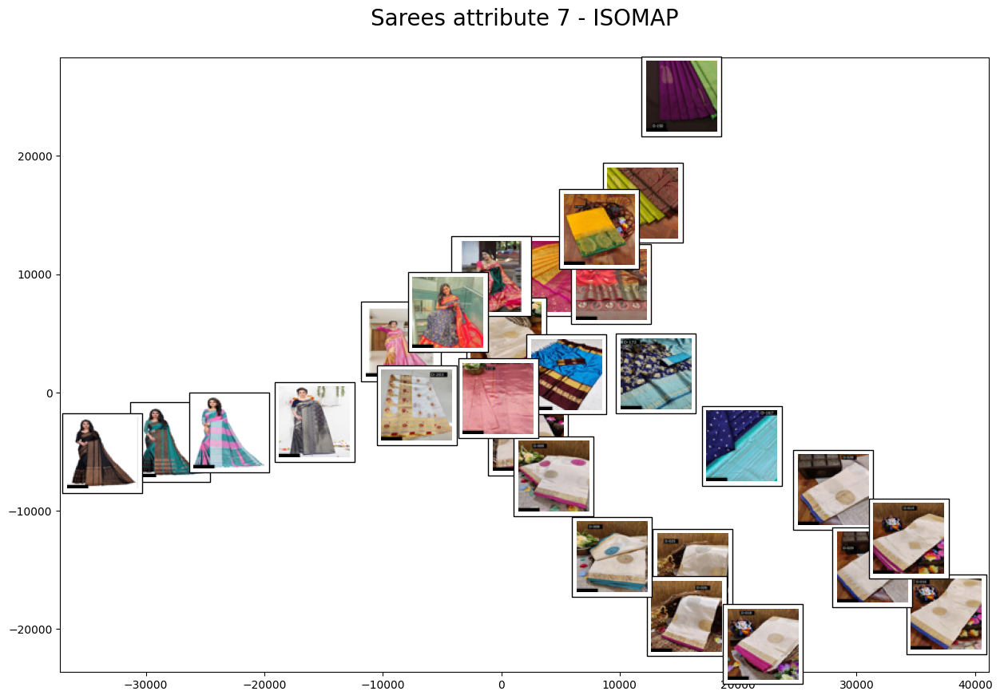

In [158]:
plot_components(images,isomap, actual_images)
plt.title("Sarees attribute 7 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

x - axis -> design styles (angle of lines)

y - axis -> color shade (light to dark)

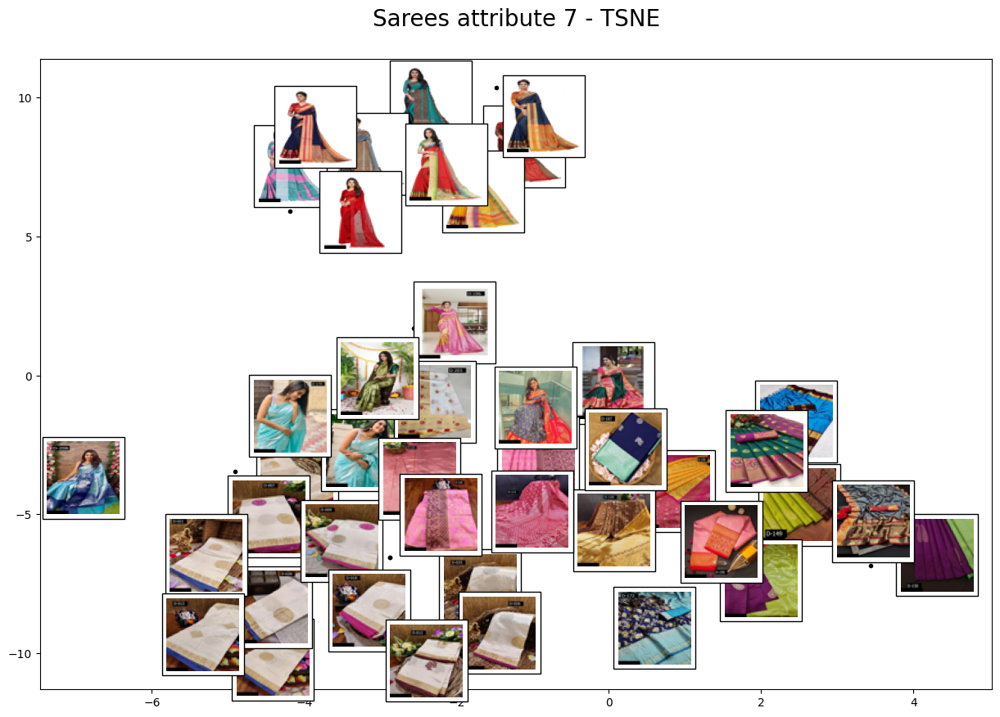

In [159]:
plot_components(images,tsne, actual_images)
plt.title("Sarees attribute 7 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

2 clusters bottom (without models) and top (with models)

y - axis -> color shade (light to dark)

In [187]:
images, actual_images = load_and_preprocess_images(samples['Sarees_attr_5'])

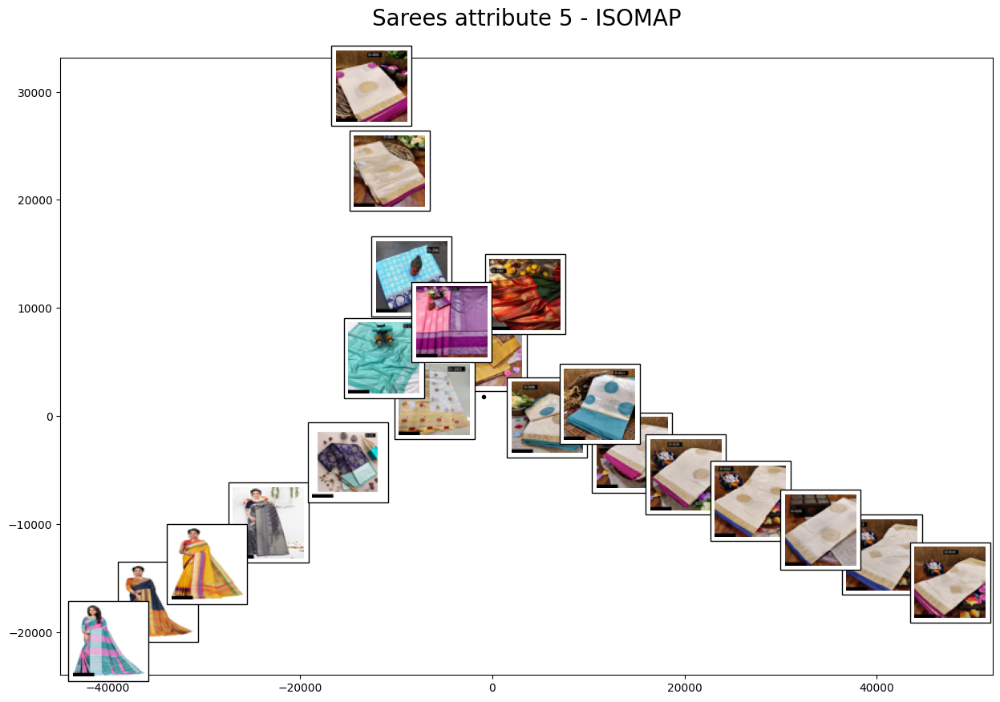

In [161]:
plot_components(images,isomap, actual_images)
plt.title("Sarees attribute 5 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

X - axis -> color (colorful to plain sarees)

y - axis -> pattern (strips to plain)

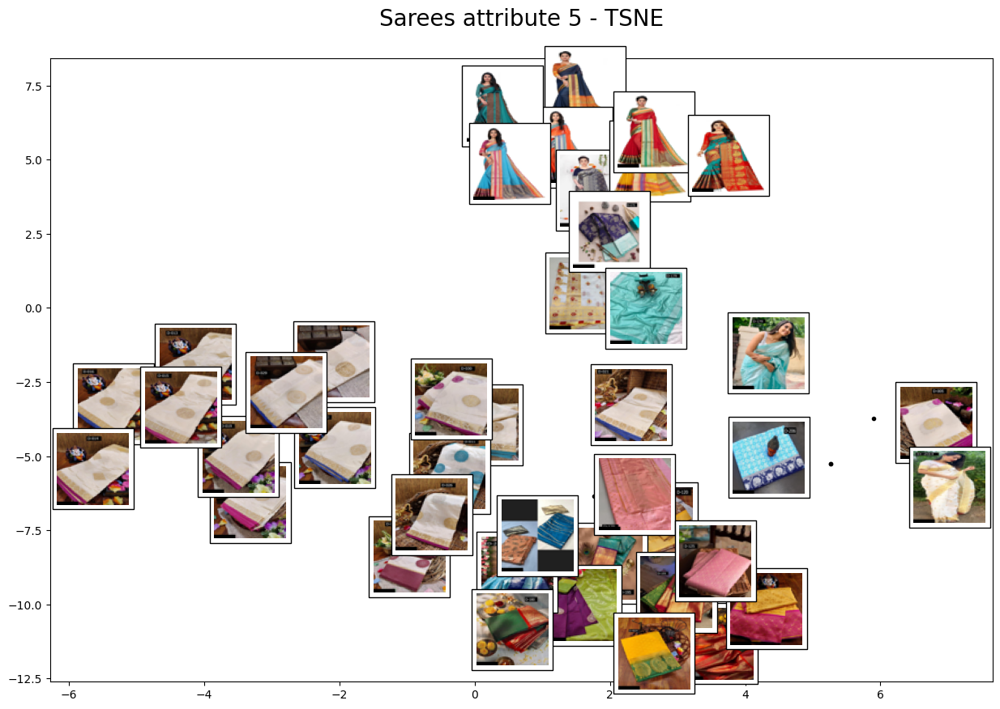

In [188]:
plot_components(images,tsne, actual_images)
plt.title("Sarees attribute 5 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

x - axis -> Color (plain to colorful)

y - axis -> model (not present to present)

c.) **Kurtis** 

In [163]:
images, actual_images = load_and_preprocess_images(samples['Kurtis_attr_9'])

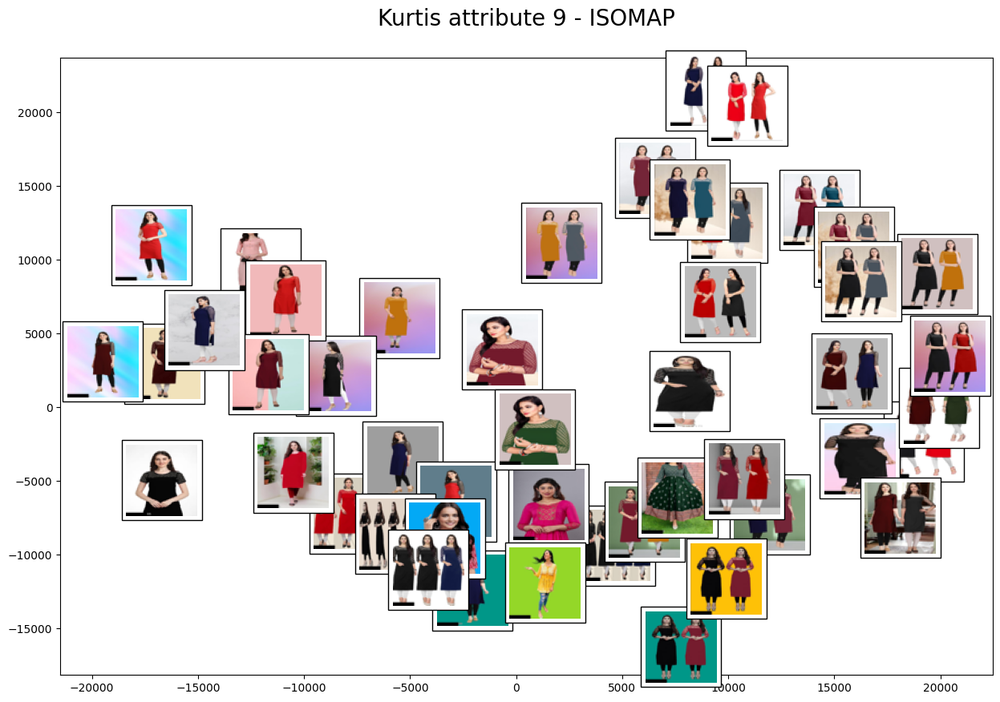

In [164]:
plot_components(images,isomap, actual_images)
plt.title("Kurtis attribute 9 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

x - axis -> number of models

y - axis -> intensity of background color

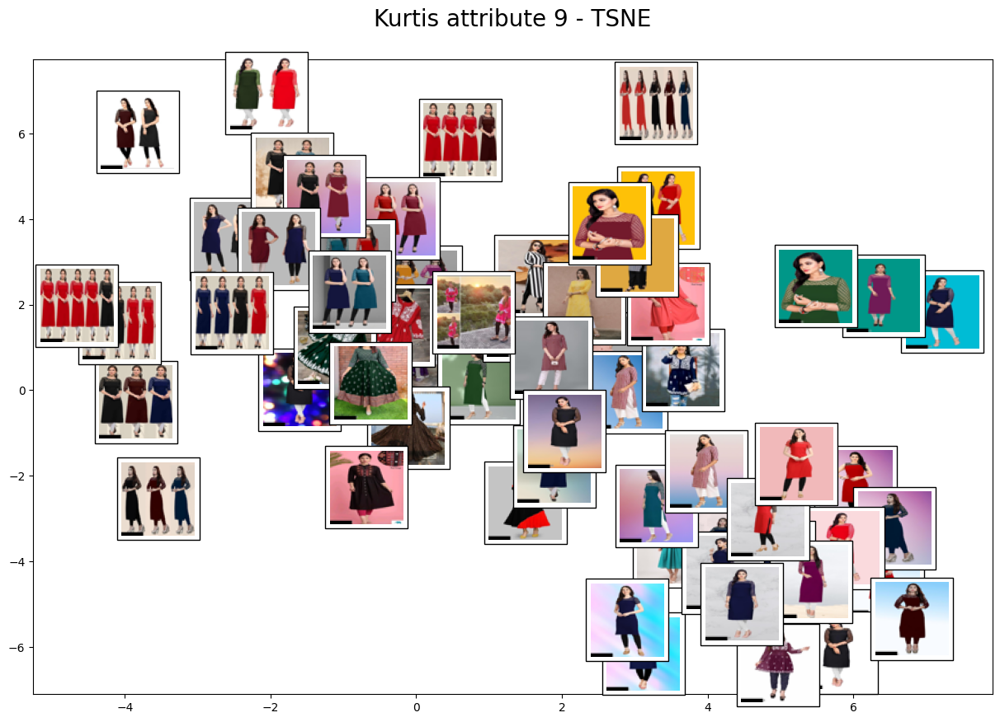

In [170]:
plot_components(images,tsne, actual_images)
plt.title("Kurtis attribute 9 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

x - axis -> No of models (high to low)

y - axis -> background color difference

In [166]:
images, actual_images = load_and_preprocess_images(samples['Kurtis_attr_5'])

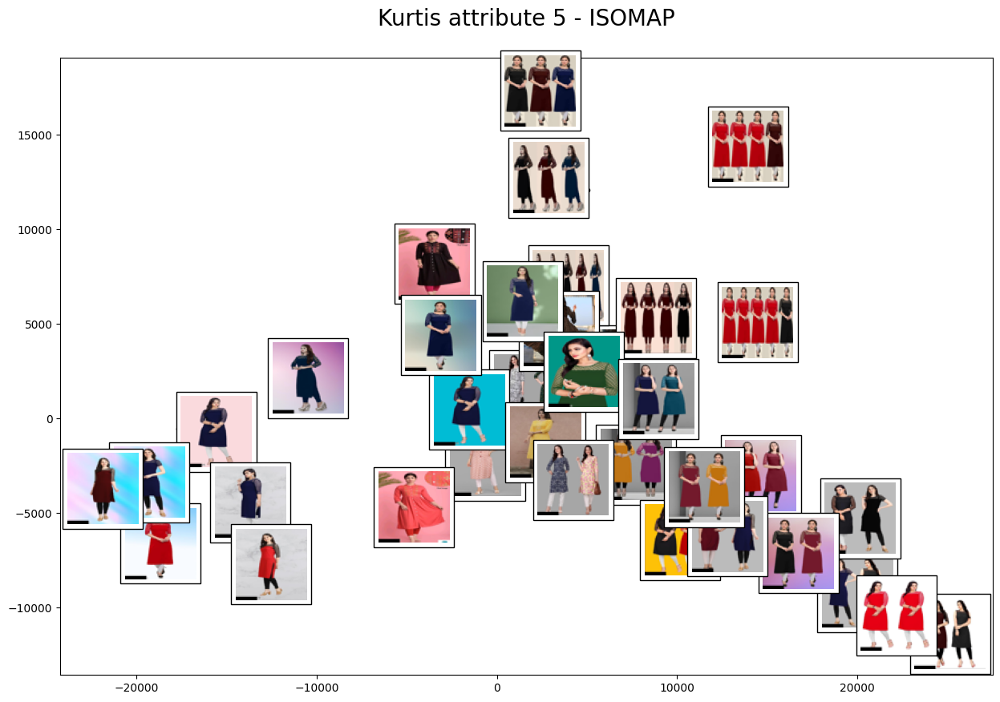

In [168]:
plot_components(images,isomap, actual_images)
plt.title("Kurtis attribute 5 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

x - axis -> Background effect (complex to plain)

y - axis -> color intensity (bright to dark) and no of models

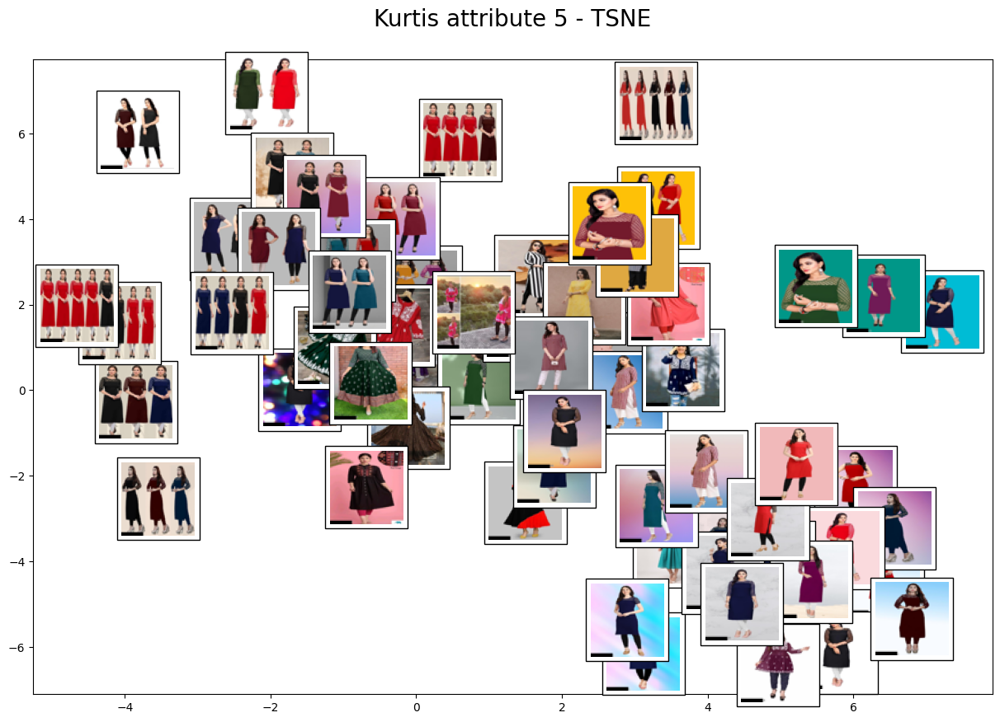

In [169]:
plot_components(images,tsne, actual_images)
plt.title("Kurtis attribute 5 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

x axis -> No of models (high to low)

y axis -> No of models (low to high)

d.) **Women Tshirts**

In [172]:
images, actual_images = load_and_preprocess_images(samples['Women Tshirts_attr_7'])

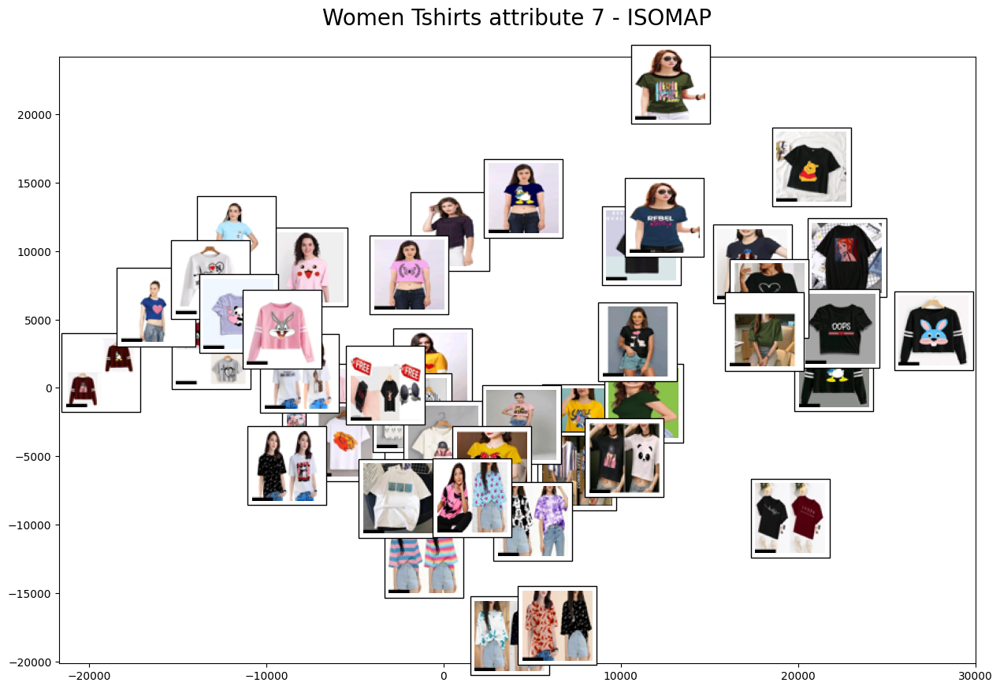

In [173]:
plot_components(images,isomap, actual_images)
plt.title("Women Tshirts attribute 7 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

x axis -> color intensity (white to black)

y axis -> no of models 

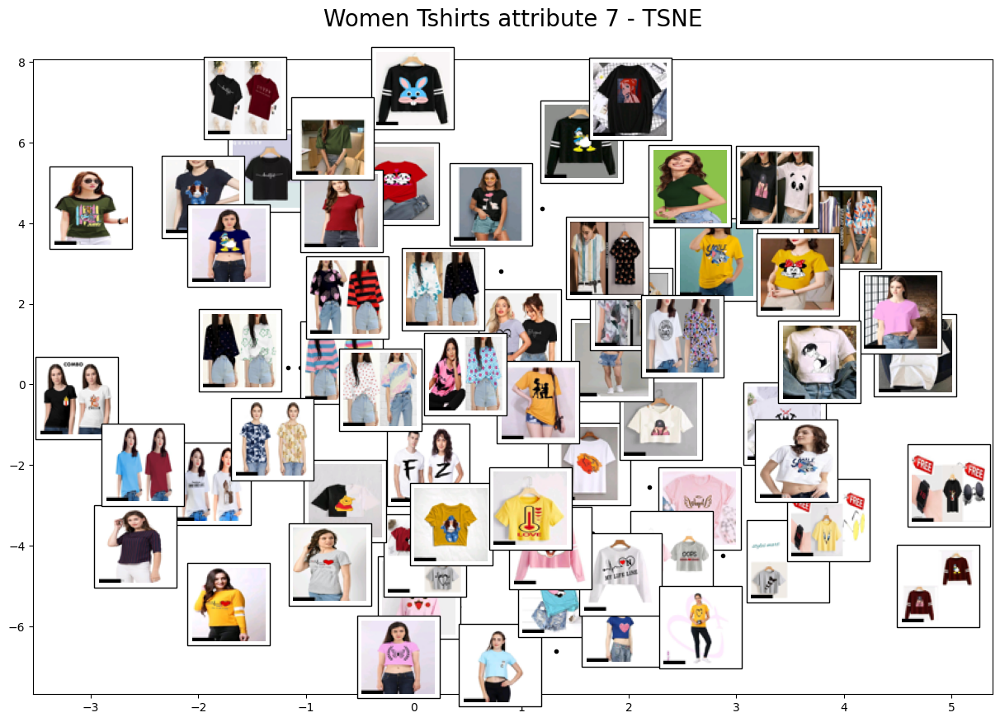

In [175]:
plot_components(images,tsne, actual_images)
plt.title("Women Tshirts attribute 7 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

x axis -> length (long to short)

y axis -> color shade (lighter to darker)

In [176]:
images, actual_images = load_and_preprocess_images(samples['Women Tshirts_attr_1'])

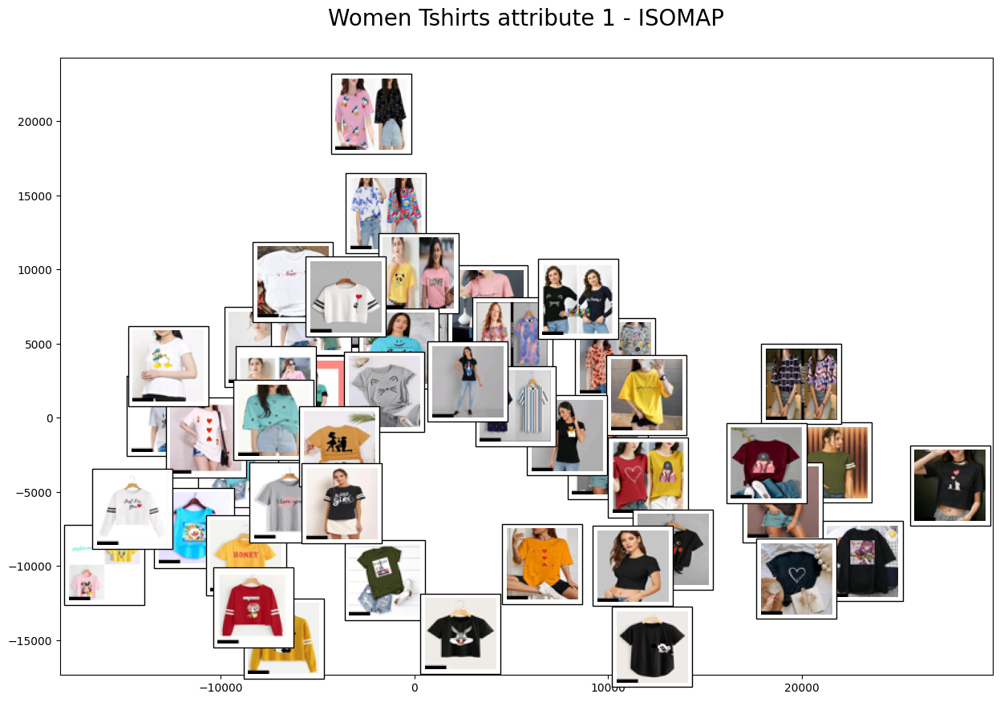

In [177]:
plot_components(images,isomap, actual_images)
plt.title("Women Tshirts attribute 1 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

x axis -> color shade (lighter to darker) and model presence and backgroud intensity

y axis -> no of Tshirts (low to high)

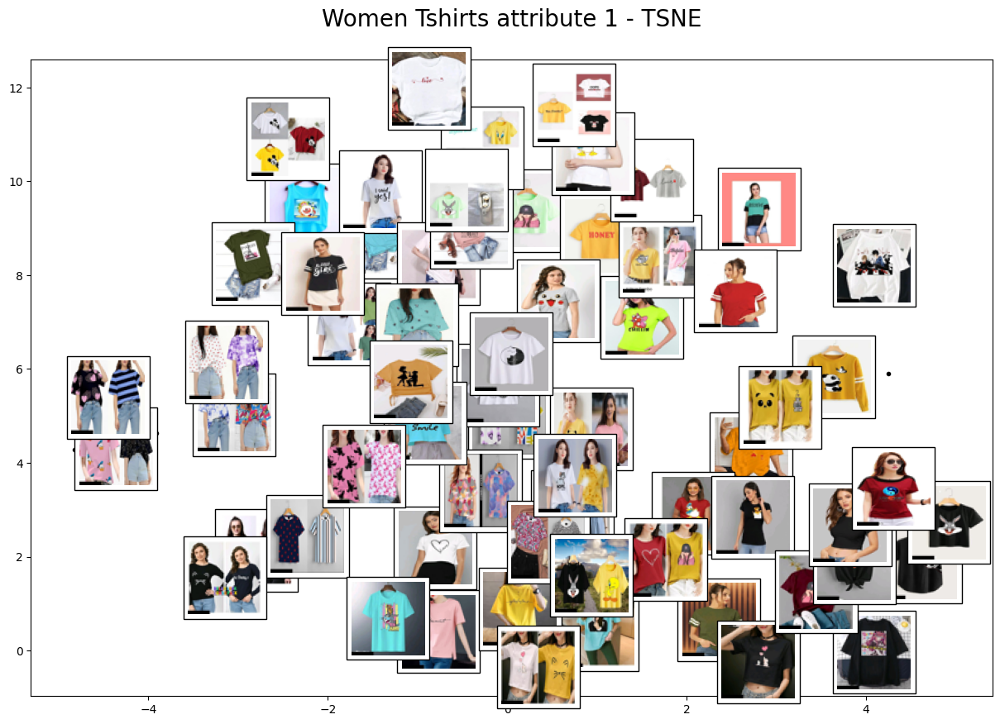

In [178]:
plot_components(images,tsne, actual_images)
plt.title("Women Tshirts attribute 1 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

x axis -> no of t ahirts

y axis -> intensity of background

e.) **Women Tops & Tunics**

In [179]:
images, actual_images = load_and_preprocess_images(samples['Women Tops & Tunics_attr_4'])

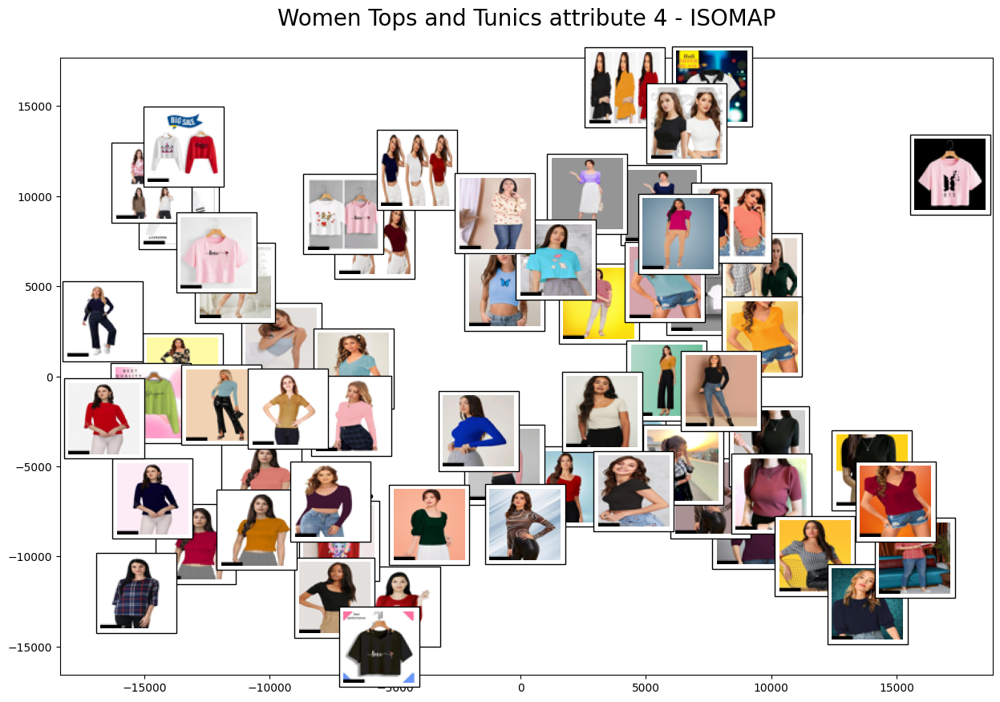

In [180]:
plot_components(images,isomap, actual_images)
plt.title("Women Tops and Tunics attribute 4 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

x axis -> sleeve length (long to short)

y axis -> no of models/Tops

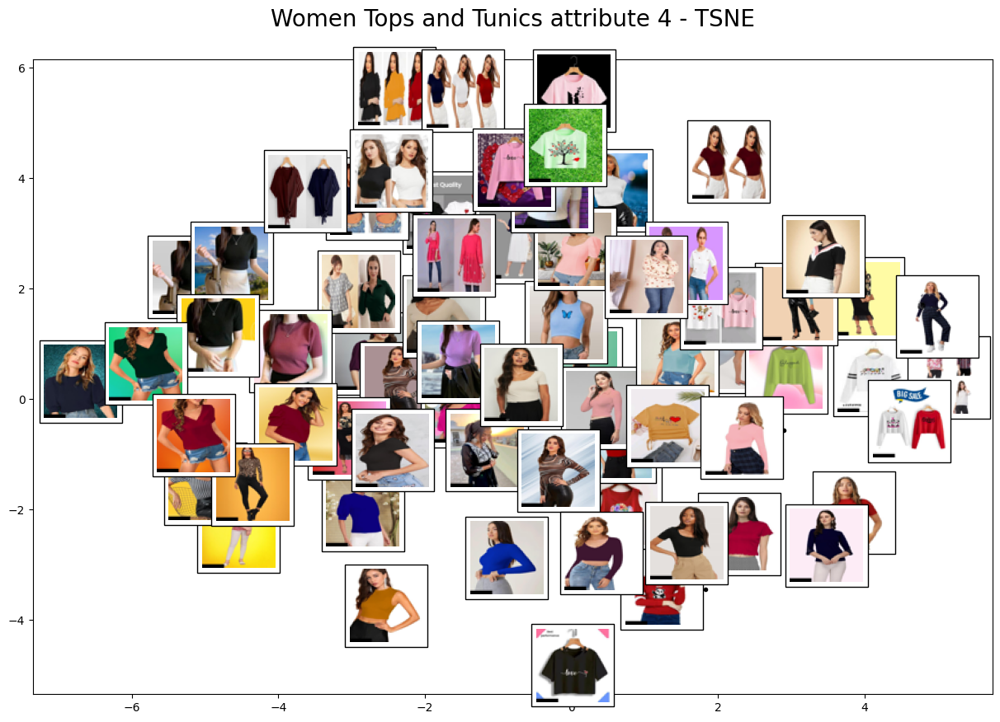

In [181]:
plot_components(images,tsne, actual_images)
plt.title("Women Tops and Tunics attribute 4 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

x axis -> sleeve length (short to long)

y axis -> no of tops

In [182]:
images, actual_images = load_and_preprocess_images(samples['Women Tops & Tunics_attr_1'])

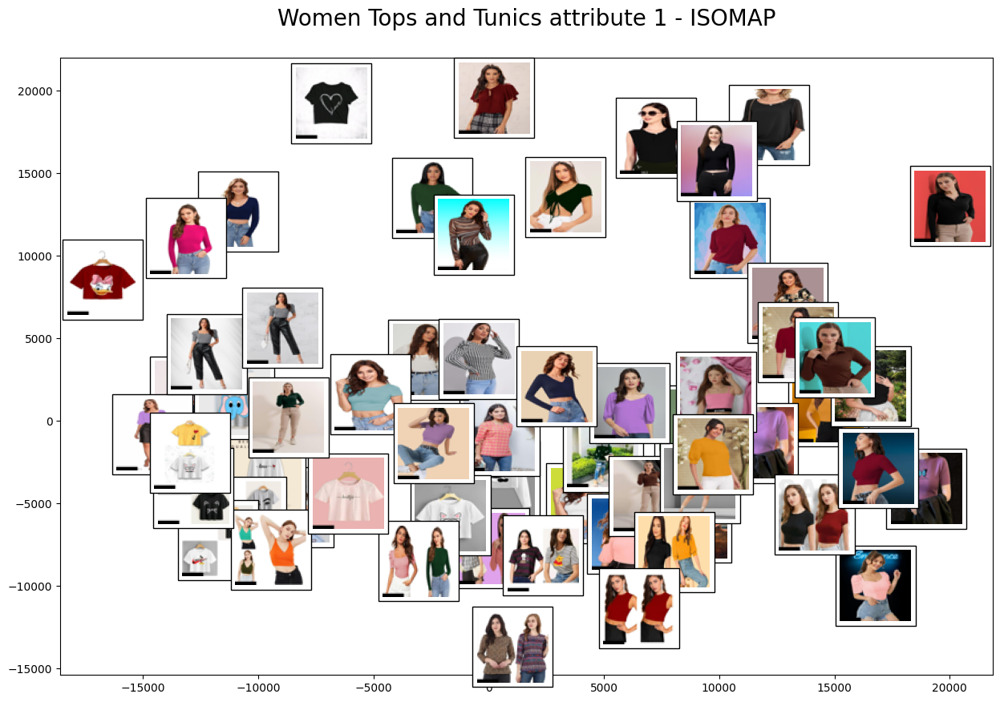

In [184]:
plot_components(images,isomap, actual_images)
plt.title("Women Tops and Tunics attribute 1 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

x axis -> Background color intensity

y axis -> No of models (high to low)

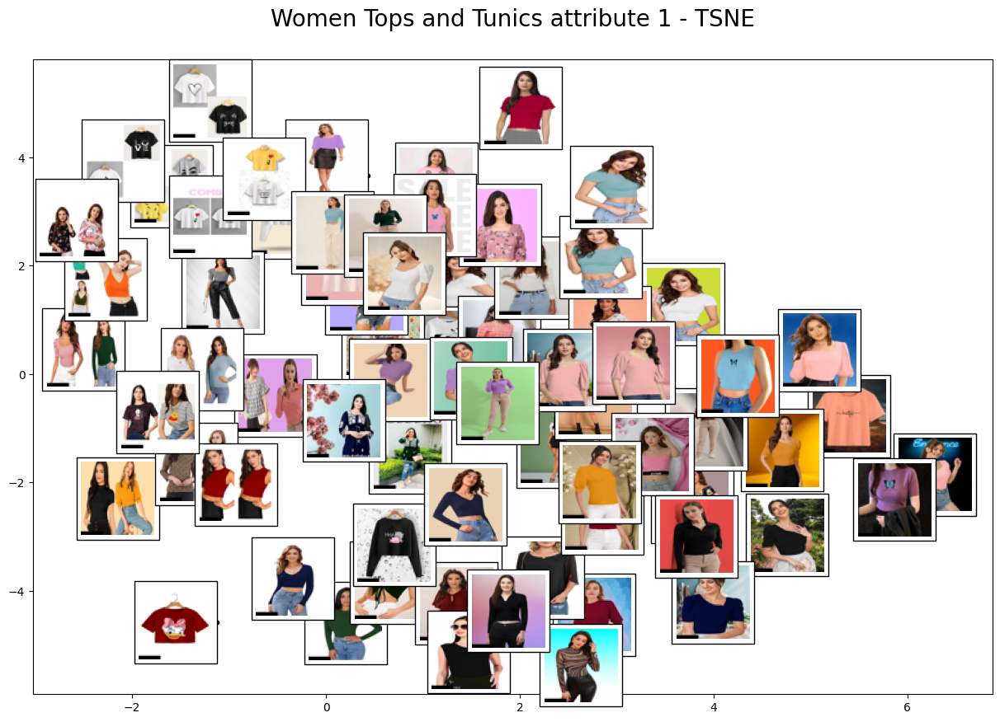

In [185]:
plot_components(images,tsne, actual_images)
plt.title("Women Tops and Tunics attribute 1 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

x axis -> No of tops/models and background color intensity

y axis -> Sleeve length (long to short)